## Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
from shapely.geometry import Point, LineString

In [2]:
import warnings
warnings.filterwarnings('ignore')

---
# Bubble map showing accomodation prices in "Barcelona"
---

## Loading dataset

In [3]:
df = pd.read_csv('listings.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,17475,Rental unit in 08013 Barcelona · ★4.40 · 1 bed...,65623,Luca,Eixample,la Dreta de l'Eixample,41.399390,2.17044,Entire home/apt,140.0,5,26,2023-12-04,0.16,1,32,9,NaN
1,18674,Rental unit in Barcelona · ★4.33 · 3 bedrooms ...,71615,Mireia Maria,Eixample,la Sagrada Família,41.405560,2.17262,Entire home/apt,121.0,1,40,2023-11-07,0.31,30,39,7,HUTB-002062
2,198958,Rental unit in Barcelona · ★4.69 · 4 bedrooms ...,971768,Laura,Sant Martí,Diagonal Mar i el Front Marítim del Poblenou,41.408050,2.21487,Entire home/apt,304.0,2,105,2023-10-16,0.74,9,137,26,HUTB-000926
3,23197,Rental unit in Sant Adria de Besos · ★4.77 · 3...,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412432,2.21975,Entire home/apt,200.0,3,75,2023-11-25,0.48,2,300,11,HUTB005057
4,32711,Rental unit in Barcelona · ★4.48 · 2 bedrooms ...,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.17015,Entire home/apt,79.0,1,99,2023-10-18,0.66,3,297,16,HUTB-001722


In [4]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [5]:
df = df[['name', 'latitude', 'longitude', 'price',]]
df.dropna(axis=0, inplace=True)
df.reset_index(inplace=True, drop=True)

## Exploratory Data Analysis

In [6]:
df.describe()['price']

count    16056.000000
mean       126.494083
std        548.481873
min          9.000000
25%         50.000000
50%         87.000000
75%        130.000000
max      56815.000000
Name: price, dtype: float64

In [7]:
def plotdf(query, title=''):
    sns.histplot(data=df.query(query), x='price', binwidth=10, color='#69b3a2', edgecolor='#e9ecef', alpha=0.9)
    plt.title(title + f'\n(#datapoints: {len(df.query(query))})', loc='left')
    plt.xlabel('price', loc='right')
    plt.ylabel('count', loc='top')
    plt.show()

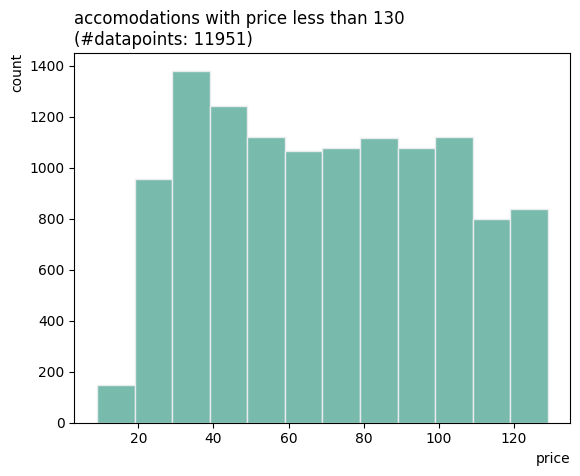

In [8]:
plotdf('price<130', 'accomodations with price less than 130')

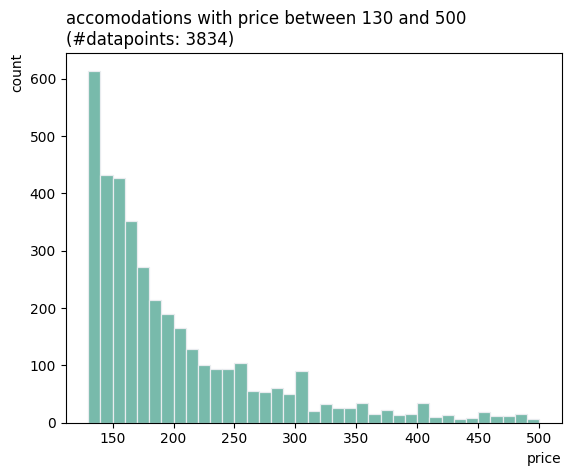

In [9]:
plotdf('price>=130 and price<500', 'accomodations with price between 130 and 500')

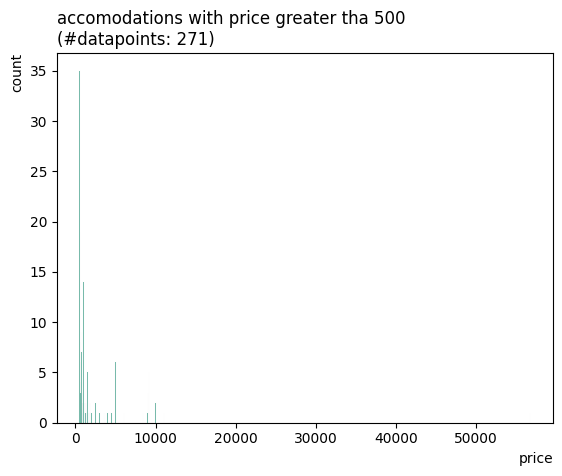

In [10]:
plotdf('price>=500', 'accomodations with price greater tha 500')

## Plotting maps

In [11]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

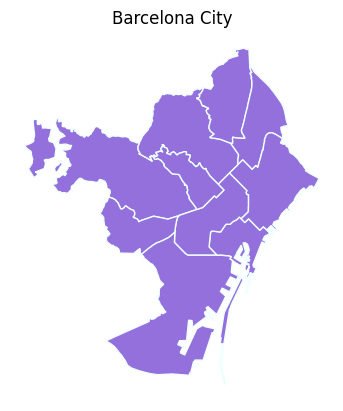

In [12]:
barca = gpd.read_file('barcelona/shapefile_distrito_barcelona.shp')
barca.plot(edgecolor='azure', color='mediumpurple')
plt.axis('off')
plt.title('Barcelona City')
plt.show()

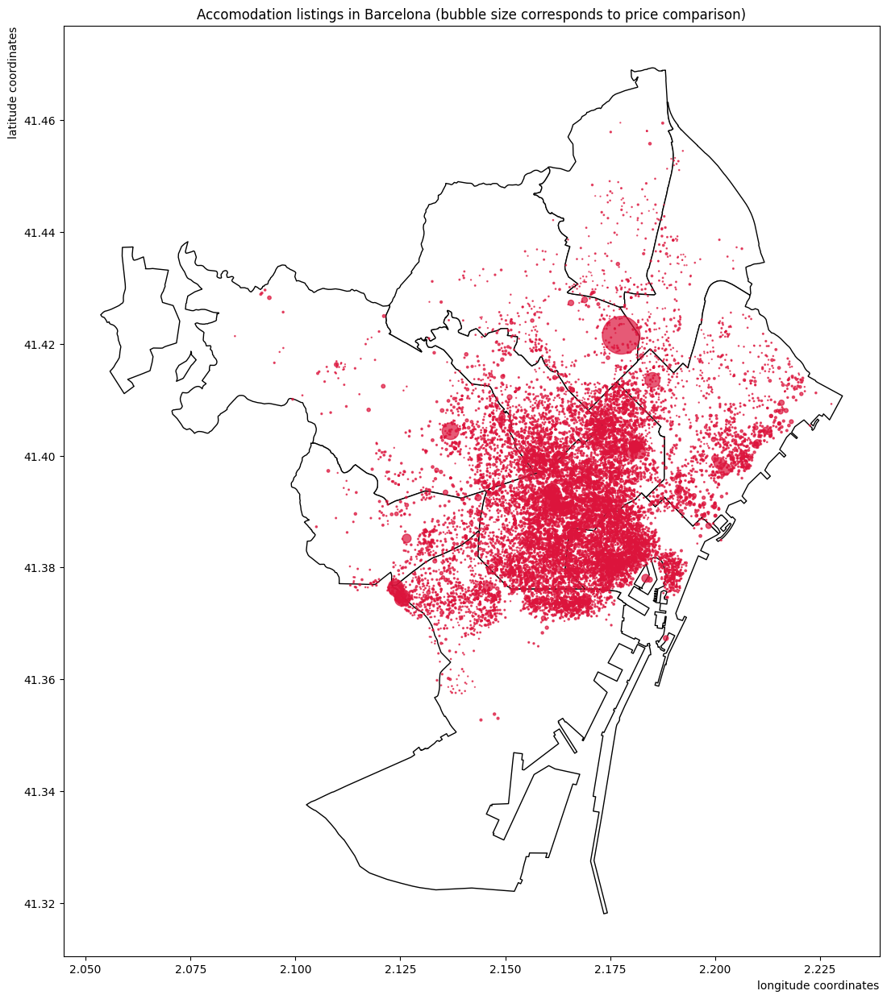

In [13]:
fig, ax = plt.subplots(figsize=(15, 15))
base = barca.plot(ax=ax, color='white', edgecolor='black')
gdf.plot(ax=base, marker='o', color='crimson', markersize=gdf.price/50, alpha=0.7)
plt.title('Accomodation listings in Barcelona (bubble size corresponds to price comparison)', loc='center')
plt.xlabel('longitude coordinates', loc='right')
plt.ylabel('latitude coordinates', loc='top')
plt.show()

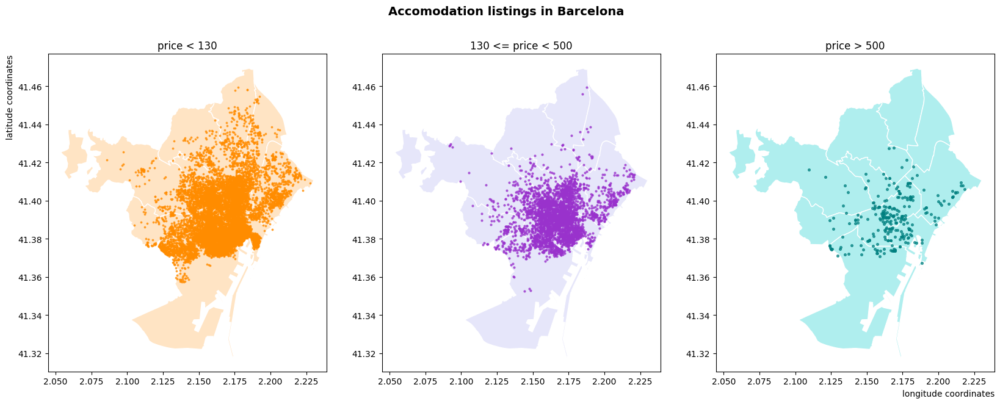

In [14]:
fig, ax = plt.subplots(1, 3, figsize=(20, 7))
base = barca.plot(ax=ax[0], color='bisque', edgecolor='white')
gdf.query('price<130').plot(ax=base, marker='o', color='darkorange', markersize=3, alpha=0.7)
ax[0].set_title('price < 130')

base = barca.plot(ax=ax[1], color='lavender', edgecolor='white')
gdf.query('price>=130 and price<500').plot(ax=base, marker='o', color='darkorchid', markersize=4, alpha=0.7)
ax[1].set_title('130 <= price < 500')

base = barca.plot(ax=ax[2], color='paleturquoise', edgecolor='white')
gdf.query('price>=500').plot(ax=base, marker='o', color='teal', markersize=7, alpha=0.7)
ax[2].set_title('price > 500')

fig.suptitle('Accomodation listings in Barcelona', fontsize=14, fontweight='bold')
ax[2].set_xlabel('longitude coordinates', loc='right')
ax[0].set_ylabel('latitude coordinates', loc='top')
plt.show()

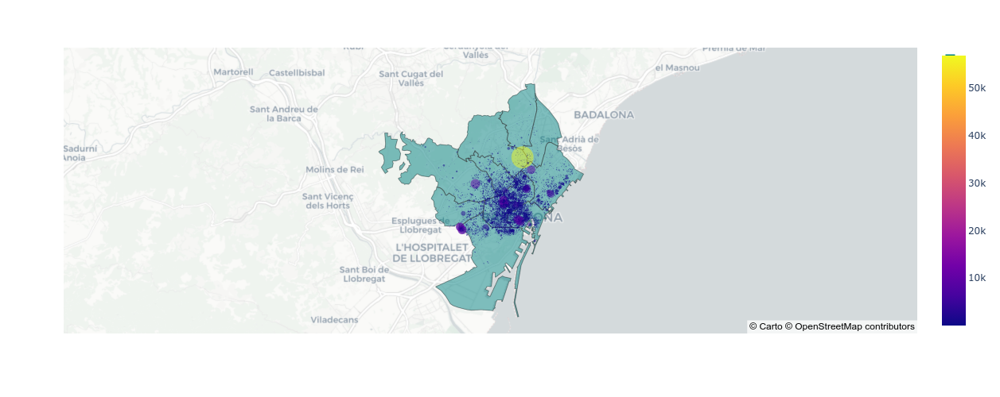

In [15]:
fig = px.choropleth_mapbox(barca, geojson=barca.geometry, locations=barca.index, 
                           color_discrete_sequence=["teal"],
                           mapbox_style="carto-positron", opacity=0.5, zoom=10,
                           center={"lat": 41.4, "lon": 2.15}, width=700, height=500)

scatter = px.scatter_mapbox(df, lat='latitude', lon='longitude', size='price',
                            hover_name='name', color='price', opacity=0.5, color_continuous_scale=px.colors.cyclical.Edge,
                            size_max=20).update_traces(marker={'sizemode':'area'})

fig.add_trace(scatter.data[0])
fig.show()

---
# Silk Route
---

In [16]:
df = pd.read_csv('silk.csv')
df.sort_values(by='longitude', inplace=True)
df.reset_index(inplace=True, drop=False)
df.head()

,index,city,latitude,longitude
0,34,Izmir,38.4192,27.1287
1,30,Istanbul,41.0082,28.9784
2,31,Bursa,40.1824,29.0670
3,32,Konya,37.8714,32.4846
4,21,Tyre,33.2730,35.1960


In [17]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [18]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

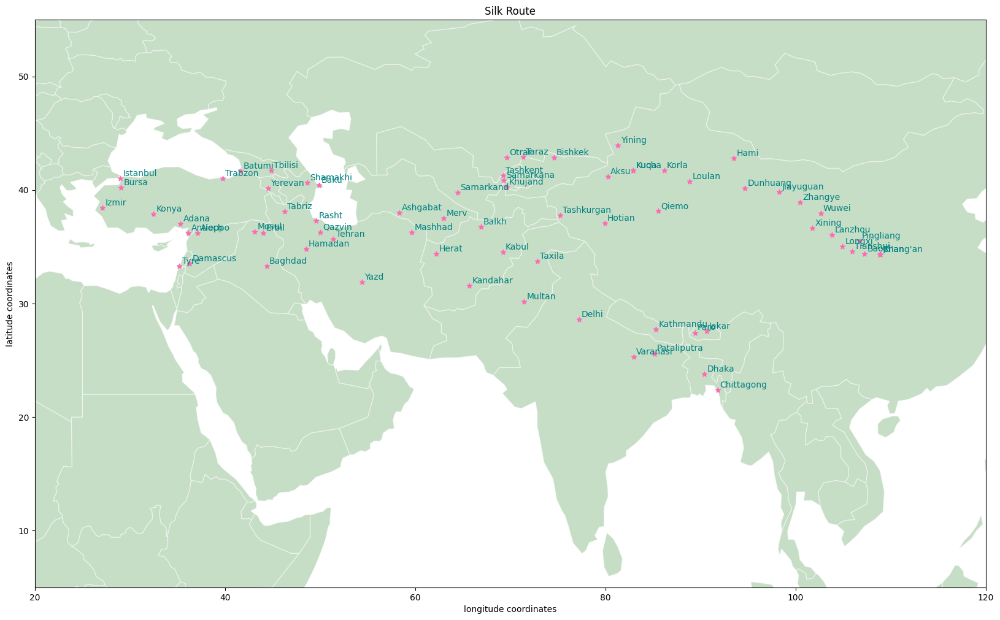

In [19]:
fig, ax = plt.subplots(figsize=(20, 15))
base = world.plot(ax=ax, color='darkseagreen', edgecolor='white', alpha=0.5)
gdf.plot(ax=base, marker='*', color='hotpink')

for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.city):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), color='teal', textcoords="offset points")

# ax.plot(np.array(df.longitude), np.array(df.latitude), '-')
    
ax.set_xlabel('longitude coordinates')
ax.set_ylabel('latitude coordinates')    
ax.set_title('Silk Route', loc='center')

ax.set_xlim(20, 120)
ax.set_ylim(5, 55)

plt.show()

In [20]:
coordsd = {}
for each in range(len(df)):
    d = df.iloc[each]
    coordsd[d.city] = (d.longitude, d.latitude)
# coordsd

In [21]:
np.array(df.city)

array(['Izmir', 'Istanbul', 'Bursa', 'Konya', 'Tyre', 'Adana', 'Antioch',
       'Damascus', 'Aleppo', 'Trabzon', 'Batumi', 'Mosul', 'Erbil',
       'Baghdad', 'Yerevan', 'Tbilisi', 'Tabriz', 'Hamadan', 'Shamakhi',
       'Rasht', 'Baku', 'Qazvin', 'Tehran', 'Yazd', 'Ashgabat', 'Mashhad',
       'Herat', 'Merv', 'Samarkand', 'Kandahar', 'Balkh', 'Kabul',
       'Tashkent', 'Samarkana', 'Khujand', 'Otrar', 'Taraz', 'Multan',
       'Taxila', 'Bishkek', 'Tashkurgan', 'Delhi', 'Hotian', 'Aksu',
       'Yining', 'Kuqa', 'Kucha', 'Varanasi', 'Pataliputra', 'Kathmandu',
       'Qiemo', 'Korla', 'Loulan', 'Paro', 'Dhaka', 'Jakar', 'Chittagong',
       'Hami', 'Dunhuang', 'Jiayuguan', 'Zhangye', 'Xining', 'Wuwei',
       'Lanzhou', 'Longxi', 'Tianshui', 'Pingliang', 'Baoji', "Chang'an",
       "Xi'an"], dtype=object)

In [22]:
# after looking at the silk route map from other resources
# and manually segregating routes
grps = [
    ['Izmir', 'Bursa'],
    ['Istanbul', 'Bursa'],
    ['Bursa', 'Konya', 'Adana', 'Antioch'],
    ['Antioch','Aleppo'],
    ['Antioch', 'Damascus', 'Tyre'],
    ['Aleppo', 'Trabzon', 'Batumi'],
    ['Batumi', 'Tbilisi', 'Yerevan', 'Tabriz', 'Rasht', 'Qazvin', 'Tehran',
     'Yazd', 'Ashgabat', 'Mashhad', 'Herat', 'Merv', 'Samarkand'],
    ['Yerevan', 'Shamakhi', 'Baku'],
    ['Tabriz', 'Erbil', 'Baghdad'],
    ['Erbil', 'Mosul'],
    [ 'Merv', 'Balkh', 'Kabul', 'Taxila', 'Multan', 'Delhi', 'Varanasi',
     'Pataliputra', 'Kathmandu', 'Paro', 'Jakar', 'Dhaka', 'Chittagong'],
    ['Kandahar', 'Taxila'],
    ['Samarkand', 'Khujand', 'Samarkana', 'Otrar', 'Taraz', 'Bishkek',
     'Aksu', 'Kuqa', 'Kucha', 'Korla', 'Loulan','Hami', 'Dunhuang',
     'Jiayuguan', 'Zhangye', 'Xining', 'Wuwei', 'Lanzhou', 'Longxi',
     'Tianshui', 'Pingliang', 'Baoji', "Chang'an", "Xi'an"],
    ['Yining', 'Kuqa'],
    ['Taxila', 'Tashkurgan'],
    ['Bishkek', 'Tashkurgan', 'Hotian', 'Qiemo', 'Loulan']
    
]

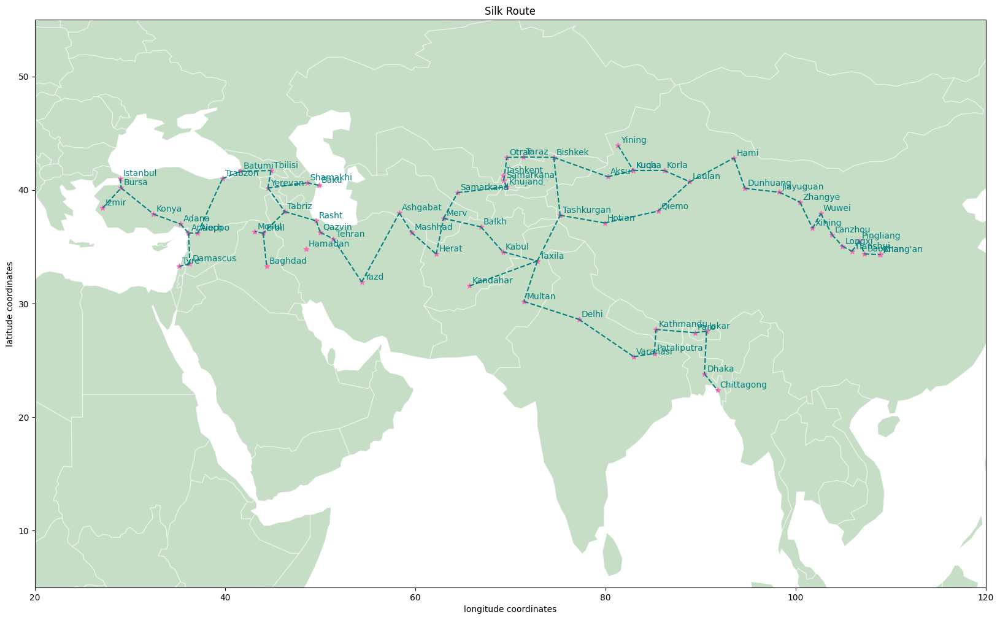

In [23]:
fig, ax = plt.subplots(figsize=(20, 15))
base = world.plot(ax=ax, color='darkseagreen', edgecolor='white', alpha=0.5)
gdf.plot(ax=base, marker='*', color='hotpink')

for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.city):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), color='teal', textcoords="offset points")

for grp in grps:
    for each in range(len(grp)-1):
        x1, y1 = coordsd[grp[each]]
        x2, y2 = coordsd[grp[each+1]]
        
        ax.plot([x1,x2], [y1,y2], '--', color='teal')
    
ax.set_xlabel('longitude coordinates')
ax.set_ylabel('latitude coordinates')    
ax.set_title('Silk Route', loc='center')

ax.set_xlim(20, 120)
ax.set_ylim(5, 55)

plt.show()

---